In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sys
from collections import Counter
np.set_printoptions(threshold=sys.maxsize)

np.random.seed(1)
def generate_rule(rule_number):
    rule = np.zeros(8, dtype=int)
    binary = np.binary_repr(rule_number, width=8)
    for i in range(8):
        rule[i] = int(binary[i])
    return rule

def apply_rule(rule, neighborhood):
    decimal = np.sum(neighborhood * np.array([1, 2, 4]))
    return rule[7 - decimal]

def simulate(rule_number, num_iterations, num_cells, initial_state):
    rule = generate_rule(rule_number)
    # initial_state = np.zeros(num_cells, dtype=int)
    # num_initial_cells = int(num_cells * initial_percentage / 100)
    # initial_indices = np.random.choice(num_cells, num_initial_cells, replace=False)
    # initial_state[initial_indices] = 1

    state = np.zeros((num_iterations, num_cells), dtype=int)
    state[0] = initial_state

    for i in range(1, num_iterations):
        for j in range(num_cells):
            neighborhood = state[i - 1, (j - 1) % num_cells], state[i - 1, j], state[i - 1, (j + 1) % num_cells]
            state[i, j] = apply_rule(rule, neighborhood)

    return state


def blockshaped(arr, n):
    assert len(arr) % n == 0, f"Length of array is not evenly divisible by {n}"
    return arr.reshape(-1, n)

def process_FHCG(state,rule_number):
  time_steps,height = state.shape
  supercells_list = []
  new_grid_supercells = []
  lower = 0.01
  upper = 0.10
  n = 10
  range_size = (upper - lower) / n
  boundaries = [lower + i * range_size for i in range(n+1)]
  parts = []
  for i in range(n):
    parts.append(boundaries[i])
  thresholds = parts
  block_size = 2
  for array in state:
    blocked_chunks = blockshaped(array,block_size)
    for each_chunk in blocked_chunks:
      supercells_list.append(list(each_chunk.flatten()))
  test_array = np.array(supercells_list)
  # print(test_array.shape)
  for i in range(len(supercells_list)):
    count = 0
    for j in range(len(supercells_list)):
      if(supercells_list[i]==supercells_list[j]):
        count = count+1 # count is number of blocks matching in the same grid (ref literature)
    new_grid_supercells.append(count/len(supercells_list))
  # print(new_grid_supercells)



  a = supercells_list
  total = len(a) # calculate the total number of nested lists in the parent list
  freq = Counter(map(tuple, a)) # count the frequency of each unique nested list in the parent list

  # calculate the probability of each unique nested list
  prob = {k: v / total for k, v in freq.items()}
  # print("debugging xmin: ",range(len(prob))[0])
  # print("debugging xmax: ",range(len(prob))[-1])
  # create a histogram plot of the probabilities
  plt.bar(range(len(prob)), list(prob.values()))
  plt.xticks(range(len(prob)), [int(''.join(map(str, k)), 2) for k in prob.keys()])
  plt.xlabel('Decimal Values of the binary values in block')
  plt.ylabel('Probability of the occurence')
  plt.title('Probability of occurence of supercells vs (Decimal Values)')

  # set y-axis tick locations and labels
  plt.yticks([i/20 for i in range(21)], [f'{i/20:.2f}' for i in range(21)])
  plt.hlines(upper,xmin=range(len(prob))[0],xmax=range(len(prob))[-1], colors='r', linestyles='dashed') # drawing straight line for threshold
  plt.hlines(lower,xmin=range(len(prob))[0],xmax=range(len(prob))[-1], colors='r', linestyles='dashed') # drawing straight line for threshold
  # plt.show()
  plt.savefig("histogram_{}.jpg".format(rule_number))
  plt.close()
  ################################################################
  dynamic_states = list(np.linspace(1,0,n)).reverse()
  for k in range(len(new_grid_supercells)):
    for z in range(len(thresholds)-1,0,-1):
      if(thresholds[z]<=new_grid_supercells[k]<=thresholds[z-1]):
        new_grid_supercells[k]=dynamic_states[z]
  modified_board = np.array(new_grid_supercells)
  shape = int(height/block_size)
  # print(shape)
  modified_automaton = modified_board.reshape(time_steps,shape)
  return modified_automaton



def visualize(rule_number, num_iterations, num_cells, initial_state):
    state = simulate(rule_number, num_iterations, num_cells, initial_state)
    state_cg = process_FHCG(state,rule_number)
    fig, ax = plt.subplots()
    ax.imshow(state, cmap='Greys', interpolation='nearest')
    # ax.set_xticks([])
    # ax.set_yticks([])
    plt.savefig(f'rule_{rule_number}_init_centre.png')
    plt.close()
    plt.imshow(state_cg, cmap='Greys', interpolation='nearest')
    plt.savefig(f'cg_rule_{rule_number}_init_centre.png')
    plt.close()

# Parameters
num_cells = 100
num_iterations = 100
# initial_percentages = [10, 20, 30, 40, 50]  # Add more percentages if desired
# 20, 30, 40, 50
initial_percentages = [1]  # Add more percentages if desired

# Simulate and visualize all possible 1D cellular automata rules with random initialization percentages
for rule_number in range(256):
  initial_state = np.zeros(100, dtype=int) # 101 1D Cells
  initial_state[50] = 1  # Set the middle cell as the initial state
  visualize(rule_number, num_iterations, num_cells,initial_state)



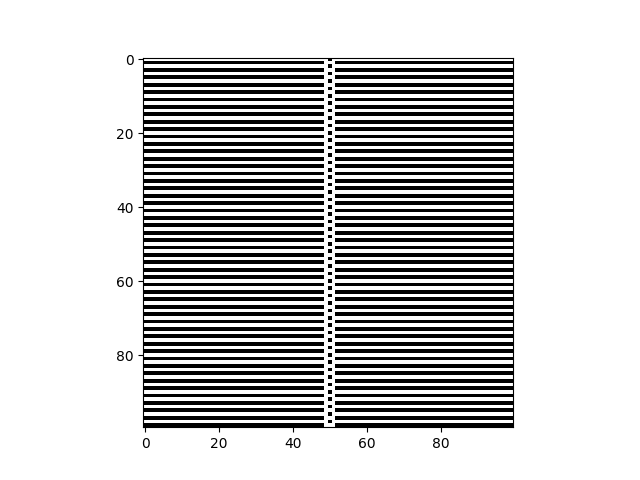
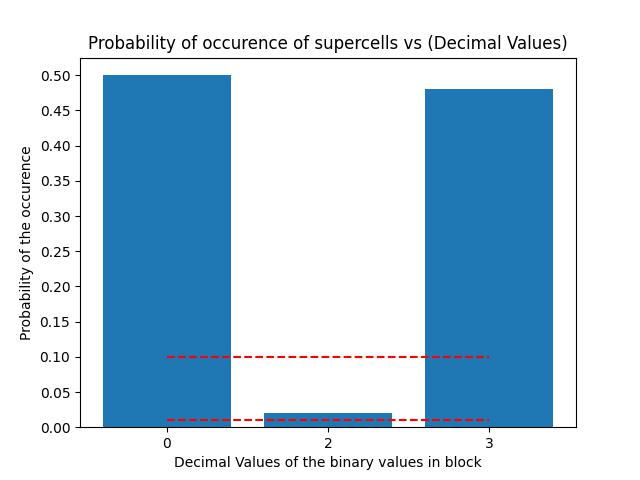
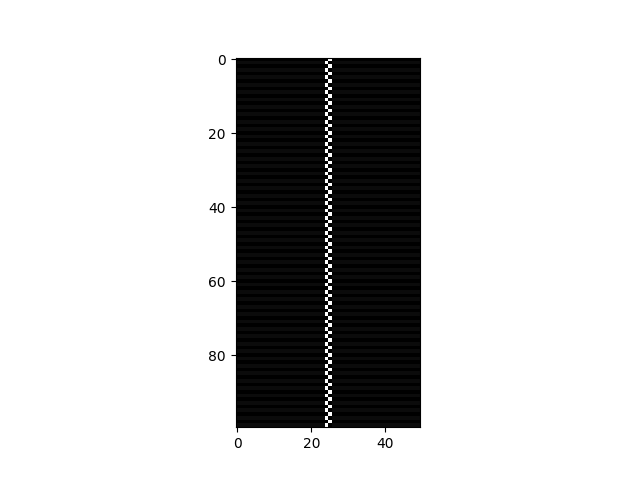
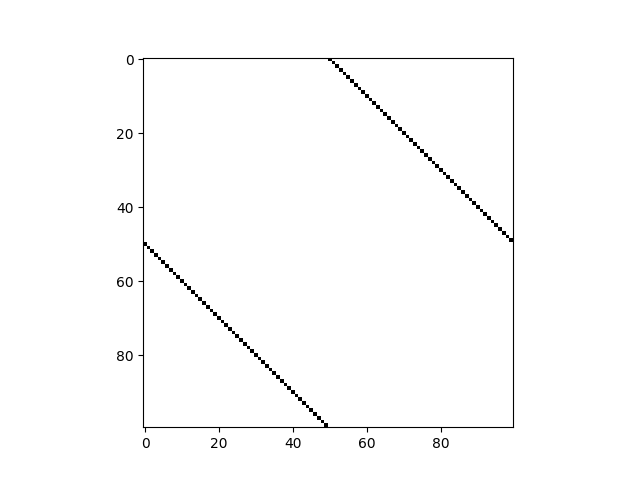
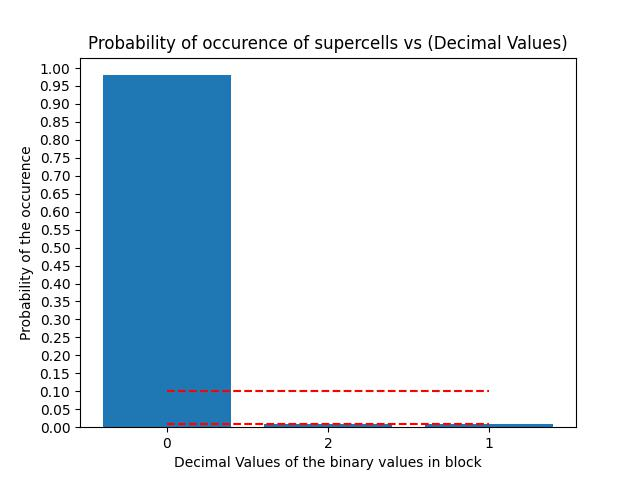
...
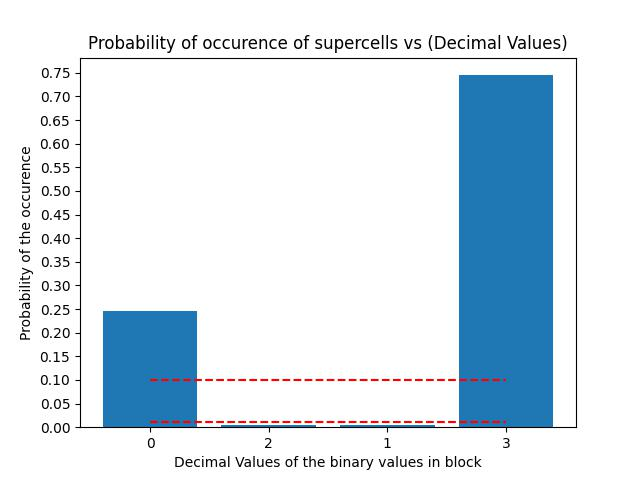
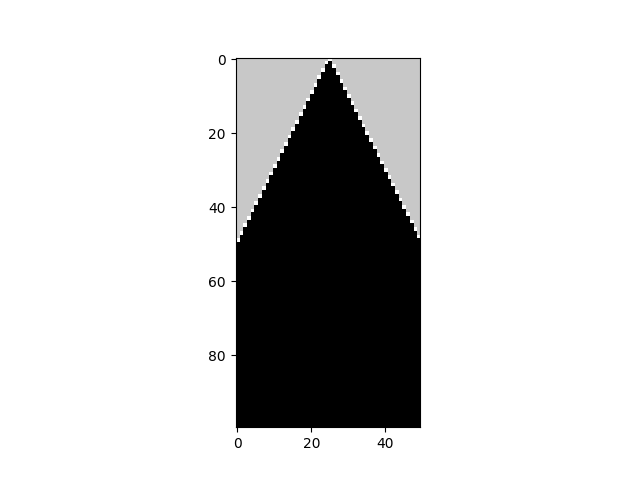
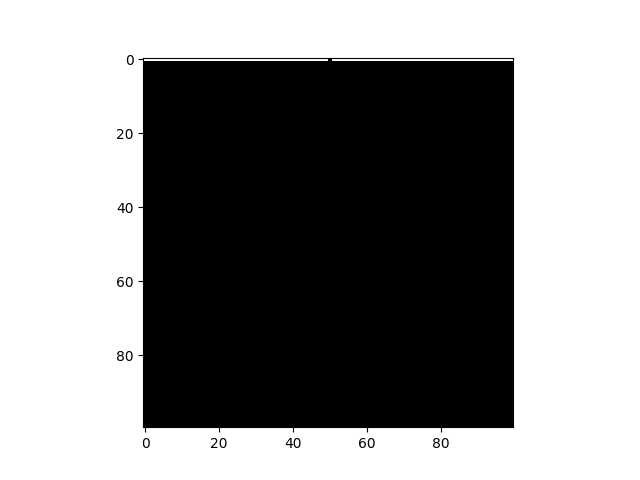
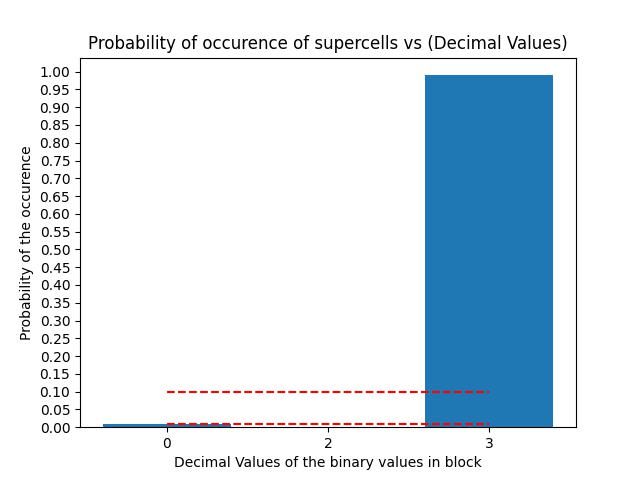
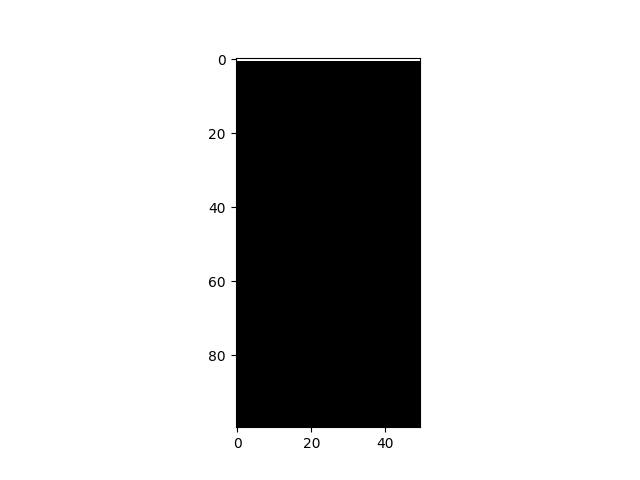

In [3]:
import base64
from IPython.display import HTML

# Create a list to store the image paths and filenames
image_info = []

# Generate the image paths and filenames
for i in range(1, 256):
    rule_image_path = f'rule_{i}_init_centre.png'
    histogram_image_path = f'histogram_{i}.jpg'
    cg_rule_image_path = f'cg_rule_{i}_init_centre.png'
    
    image_info.append((rule_image_path, histogram_image_path, cg_rule_image_path))

# Create HTML string to display the images
html_string = ''
for i in range(0, len(image_info)):
    rule_image_path, histogram_image_path, cg_rule_image_path = image_info[i]
    rule_image_data = base64.b64encode(open(rule_image_path, 'rb').read()).decode('utf-8')
    histogram_image_data = base64.b64encode(open(histogram_image_path, 'rb').read()).decode('utf-8')
    cg_rule_image_data = base64.b64encode(open(cg_rule_image_path, 'rb').read()).decode('utf-8')

    html_string += f'<div style="display: flex; flex-direction: row; margin: 10px;">'

    html_string += f'<div style="display: flex; flex-direction: column; text-align: center; margin-right: 10px;">'
    html_string += f'<p>Rule Image: {rule_image_path}</p>'
    html_string += f'<img src="data:image/png;base64,{rule_image_data}" width="400" height="400" />'
    html_string += '</div>'

    html_string += f'<div style="display: flex; flex-direction: column; text-align: center; margin-right: 10px;">'
    html_string += f'<p>Histogram Image: {histogram_image_path}</p>'
    html_string += f'<img src="data:image/jpeg;base64,{histogram_image_data}" width="400" height="400" />'
    html_string += '</div>'

    html_string += f'<div style="display: flex; flex-direction: column; text-align: center;">'
    html_string += f'<p>CG Rule Image: {cg_rule_image_path}</p>'
    html_string += f'<img src="data:image/png;base64,{cg_rule_image_data}" width="400" height="400" />'
    html_string += '</div>'

    html_string += '</div>'

    # After each set of three images, add a line break
    if (i + 1) % 3 == 0:
        html_string += '<br />'

# Display the images
HTML(html_string)
